# Medical Image Analysis Assistant
## Brain Tumor Detection from MRI Images

**Dataset:** `navoneel/brain-mri-images-for-brain-tumor-detection`  
**Classes:** Tumor | No Tumor  
**Pipeline:** Preprocessing → Feature Detection → Multi-Scale Analysis → SIFT → Segmentation → Classification → Inference

## 1. Environment Setup

In [49]:
import os
import json
import glob
import random
import warnings

import numpy as np
import pandas as pd
import cv2
import skimage
from PIL import Image

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

from skimage.feature import hog, blob_log, local_binary_pattern
from skimage.metrics import mean_squared_error as mse
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.measure import regionprops, label as sk_label

from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score,
    f1_score, confusion_matrix, classification_report,
    roc_curve, roc_auc_score
)

warnings.filterwarnings("ignore")
np.random.seed(42)
random.seed(42)

plt.rcParams["figure.dpi"] = 120
plt.rcParams["axes.titlesize"] = 11
plt.rcParams["axes.spines.top"] = False
plt.rcParams["axes.spines.right"] = False

print(f"OpenCV     : {cv2.__version__}")
print(f"scikit-img : {skimage.__version__}")
print(f"NumPy      : {np.__version__}")
print(f"Pandas     : {pd.__version__}")

OpenCV     : 4.13.0
scikit-img : 0.25.2
NumPy      : 2.0.2
Pandas     : 2.3.3


## 2. Dataset Loading

In [50]:
BASE_DIR = "/kaggle/input/datasets/navoneel/brain-mri-images-for-brain-tumor-detection"

records = []
for label in ["yes", "no"]:
    folder = os.path.join(BASE_DIR, label)
    for ext in ["*.jpg", "*.jpeg", "*.png", "*.JPG", "*.JPEG", "*.PNG"]:
        for path in glob.glob(os.path.join(folder, ext)):
            records.append({"img_path": path, "label": label})

df = pd.DataFrame(records)
df["label_clean"] = df["label"].map({"yes": "Tumor", "no": "No Tumor"})

le = LabelEncoder()
df["label_enc"] = le.fit_transform(df["label_clean"])

print(f"Total images  : {len(df)}")
print(f"Classes       : {list(le.classes_)}")
print(df["label_clean"].value_counts().to_string())

Total images  : 253
Classes       : ['No Tumor', 'Tumor']
label_clean
Tumor       155
No Tumor     98


## 3. Exploratory Data Analysis

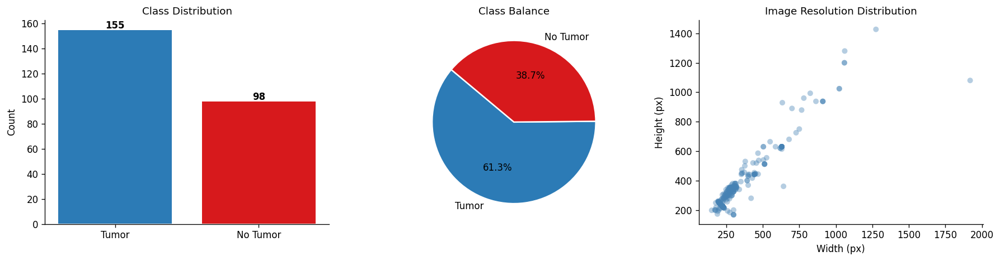

Resolution range : 150x168  to  1920x1427
Mean resolution  : 354x386


In [51]:
class_counts = df["label_clean"].value_counts()
palette = ["#2C7BB6", "#D7191C"]

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

axes[0].bar(class_counts.index, class_counts.values, color=palette, edgecolor="white", linewidth=1.2)
axes[0].set_title("Class Distribution")
axes[0].set_ylabel("Count")
for bar, val in zip(axes[0].patches, class_counts.values):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, str(val),
                 ha="center", fontweight="bold")

axes[1].pie(class_counts.values, labels=class_counts.index, autopct="%1.1f%%",
            colors=palette, startangle=140, wedgeprops={"linewidth": 1.5, "edgecolor": "white"})
axes[1].set_title("Class Balance")

widths, heights = [], []
for p in df["img_path"]:
    try:
        w, h = Image.open(p).size
        widths.append(w)
        heights.append(h)
    except Exception:
        pass

axes[2].scatter(widths, heights, alpha=0.4, color="steelblue", edgecolors="none")
axes[2].set_title("Image Resolution Distribution")
axes[2].set_xlabel("Width (px)")
axes[2].set_ylabel("Height (px)")

plt.tight_layout()
plt.show()

print(f"Resolution range : {min(widths)}x{min(heights)}  to  {max(widths)}x{max(heights)}")
print(f"Mean resolution  : {np.mean(widths):.0f}x{np.mean(heights):.0f}")

## 4. Utility Functions

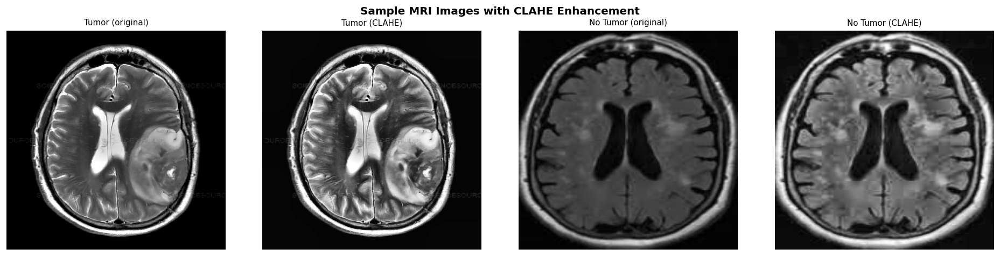

In [52]:
IMG_SIZE = (224, 224)

def load_image(path, size=IMG_SIZE):
    img = cv2.imread(str(path))
    if img is None:
        return np.zeros((*size, 3), dtype=np.uint8)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return cv2.resize(img, size)

def apply_clahe(img_rgb):
    """CLAHE on L-channel of LAB space — standard MRI contrast enhancement."""
    lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB)
    clahe = cv2.createCLAHE(clipLimit=2.5, tileGridSize=(8, 8))
    lab[:, :, 0] = clahe.apply(lab[:, :, 0])
    return cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

def show_images(images, titles, ncols=4, figsize=(16, 6), suptitle=None, cmap_gray=True):
    n = len(images)
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
    axes = np.array(axes).reshape(-1)
    for i, ax in enumerate(axes):
        if i < n:
            im = images[i]
            ax.imshow(im, cmap="gray" if (im.ndim == 2 and cmap_gray) else None)
            ax.set_title(titles[i], fontsize=9)
        ax.axis("off")
    if suptitle:
        plt.suptitle(suptitle, fontweight="bold", fontsize=12)
    plt.tight_layout()
    plt.show()

tumor_paths   = df[df["label_clean"] == "Tumor"]["img_path"].tolist()
no_tumor_paths = df[df["label_clean"] == "No Tumor"]["img_path"].tolist()

img1      = load_image(tumor_paths[0])
img2      = load_image(no_tumor_paths[0])
img1_gray = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
img2_gray = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)

img1_enh  = apply_clahe(img1)
img2_enh  = apply_clahe(img2)

show_images(
    [img1, img1_enh, img2, img2_enh],
    ["Tumor (original)", "Tumor (CLAHE)", "No Tumor (original)", "No Tumor (CLAHE)"],
    ncols=4, figsize=(16, 4),
    suptitle="Sample MRI Images with CLAHE Enhancement"
)

## 5. Image Preprocessing — Gaussian Filter, Median Filter, CLAHE

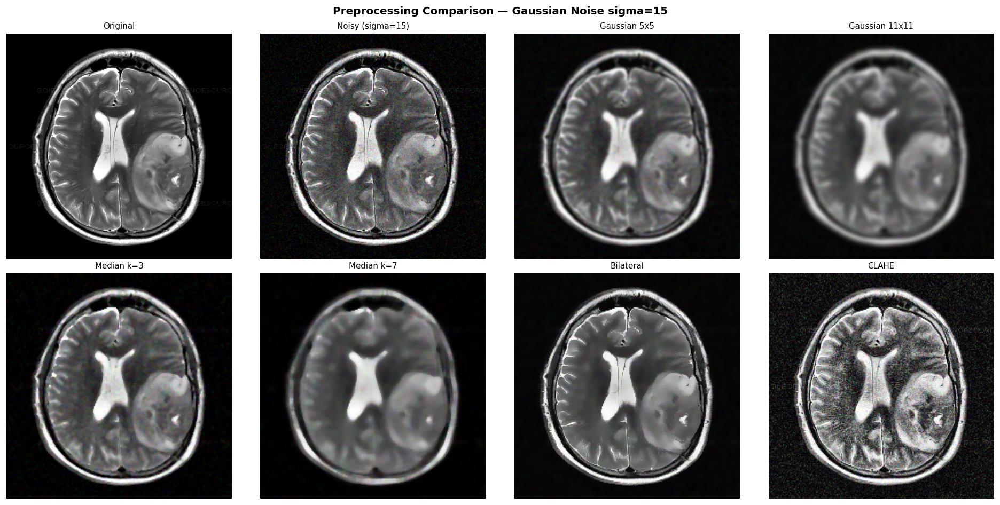

In [53]:
img_ref   = img1.copy()
noise     = np.random.normal(0, 15, img_ref.shape).astype(np.int16)
img_noisy = np.clip(img_ref.astype(np.int16) + noise, 0, 255).astype(np.uint8)

img_g5    = cv2.GaussianBlur(img_noisy, (5, 5),   sigmaX=0)
img_g11   = cv2.GaussianBlur(img_noisy, (11, 11), sigmaX=0)
img_m3    = cv2.medianBlur(img_noisy, 3)
img_m7    = cv2.medianBlur(img_noisy, 7)
img_bilat = cv2.bilateralFilter(img_noisy, d=9, sigmaColor=75, sigmaSpace=75)
img_clahe = apply_clahe(img_noisy)

show_images(
    [img_ref, img_noisy, img_g5, img_g11, img_m3, img_m7, img_bilat, img_clahe],
    ["Original", "Noisy (sigma=15)", "Gaussian 5x5", "Gaussian 11x11",
     "Median k=3", "Median k=7", "Bilateral", "CLAHE"],
    ncols=4, figsize=(16, 8),
    suptitle="Preprocessing Comparison — Gaussian Noise sigma=15"
)

## 6. Filtering Evaluation — MSE and PSNR Metrics

        Method      MSE    PSNR
         Noisy 159.3309 26.1078
  Gaussian 5x5 285.9022 23.5686
Gaussian 11x11 620.7595 20.2016
    Median k=3 199.8843 25.1230
    Median k=7 585.9721 20.4520
     Bilateral  62.9620 30.1400
         CLAHE 794.4271 19.1303

Best PSNR : Bilateral
Best MSE  : Bilateral


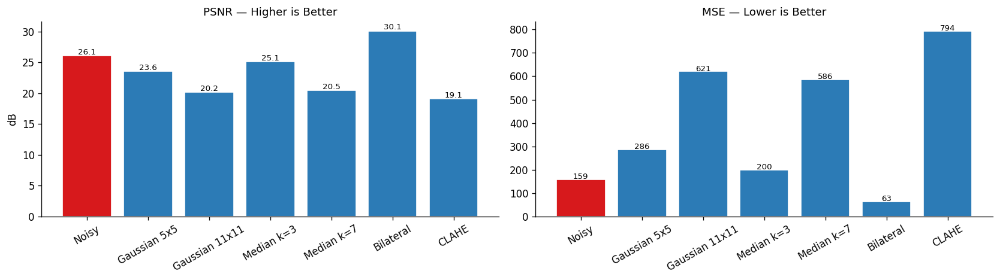

In [54]:
def metric_entry(name, original, filtered):
    return {
        "Method": name,
        "MSE":    round(float(mse(original, filtered)), 4),
        "PSNR":   round(float(psnr(original, filtered, data_range=255)), 4),
    }

filter_metrics = pd.DataFrame([
    metric_entry("Noisy",          img_ref, img_noisy),
    metric_entry("Gaussian 5x5",   img_ref, img_g5),
    metric_entry("Gaussian 11x11", img_ref, img_g11),
    metric_entry("Median k=3",     img_ref, img_m3),
    metric_entry("Median k=7",     img_ref, img_m7),
    metric_entry("Bilateral",      img_ref, img_bilat),
    metric_entry("CLAHE",          img_ref, img_clahe),
])

print(filter_metrics.to_string(index=False))
print(f"\nBest PSNR : {filter_metrics.loc[filter_metrics['PSNR'].idxmax(), 'Method']}")
print(f"Best MSE  : {filter_metrics.loc[filter_metrics['MSE'].idxmin(), 'Method']}")

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
colors = ["#D7191C" if m == "Noisy" else "#2C7BB6" for m in filter_metrics["Method"]]

bars1 = axes[0].bar(filter_metrics["Method"], filter_metrics["PSNR"], color=colors, edgecolor="white")
axes[0].set_title("PSNR — Higher is Better")
axes[0].tick_params(axis="x", rotation=30)
axes[0].set_ylabel("dB")
for bar, val in zip(bars1, filter_metrics["PSNR"]):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.2, f"{val:.1f}",
                 ha="center", fontsize=8)

bars2 = axes[1].bar(filter_metrics["Method"], filter_metrics["MSE"], color=colors, edgecolor="white")
axes[1].set_title("MSE — Lower is Better")
axes[1].tick_params(axis="x", rotation=30)
for bar, val in zip(bars2, filter_metrics["MSE"]):
    axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 2, f"{val:.0f}",
                 ha="center", fontsize=8)

plt.tight_layout()
plt.show()

## 7. Harris Corner Detection with Threshold Analysis

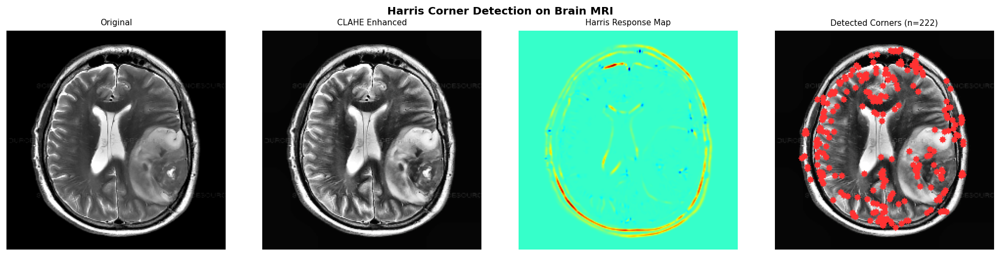

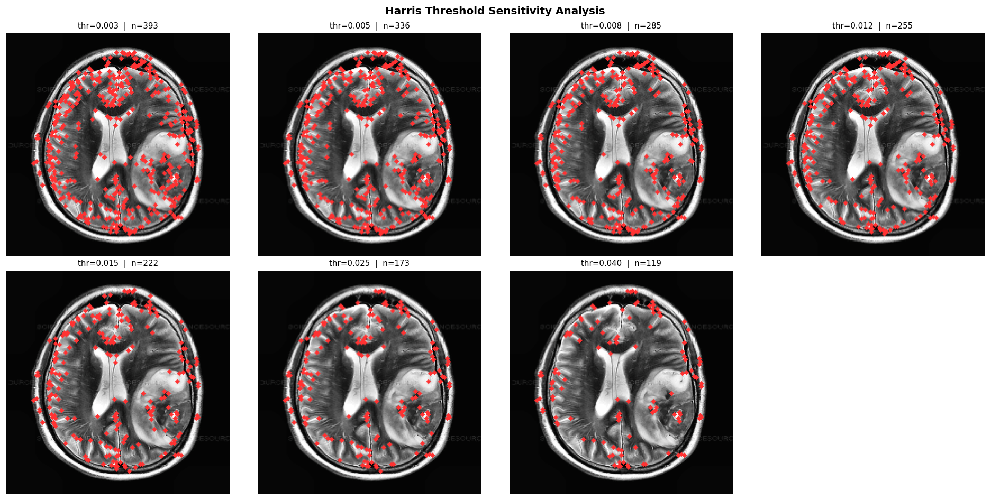

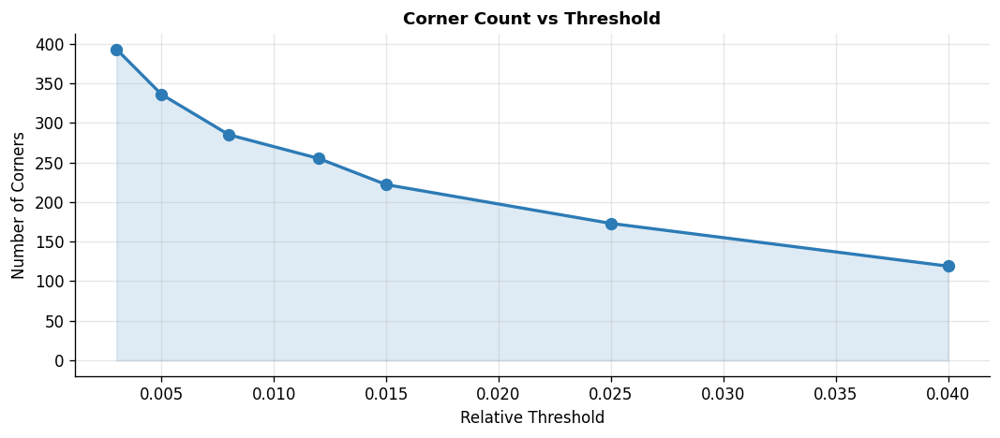

Threshold sweep summary:
  thr=0.003  corners=393
  thr=0.005  corners=336
  thr=0.008  corners=285
  thr=0.012  corners=255
  thr=0.015  corners=222
  thr=0.025  corners=173
  thr=0.040  corners=119


In [55]:
def harris_corners(img_gray, block_size=3, k_size=3, k=0.04, threshold=0.015):
    denoised = cv2.GaussianBlur(img_gray, (5, 5), 0)
    gray_f   = np.float32(denoised)
    response = cv2.cornerHarris(gray_f, block_size, k_size, k)
    response_dilated = cv2.dilate(response, None)
    thresh_val = threshold * response.max()
    mask = (response == response_dilated) & (response > thresh_val)
    return response, mask

def draw_corners(img_rgb, mask, color=(255, 50, 50), radius=3, max_points=2000):
    out = img_rgb.copy()
    ys, xs = np.where(mask)
    if len(xs) > max_points:
        idx = np.random.choice(len(xs), max_points, replace=False)
        xs, ys = xs[idx], ys[idx]
    for y, x in zip(ys, xs):
        cv2.circle(out, (x, y), radius, color, -1)
    return out, len(xs)

# Run on CLAHE-enhanced image for better corner detection
img1_enh_gray = cv2.cvtColor(img1_enh, cv2.COLOR_RGB2GRAY)
h_resp, h_mask = harris_corners(img1_enh_gray, threshold=0.015)
h_resp_vis = cv2.applyColorMap(
    cv2.normalize(h_resp, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8),
    cv2.COLORMAP_JET
)
h_vis, n_c = draw_corners(img1_enh, h_mask)

show_images(
    [img1, img1_enh, h_resp_vis, h_vis],
    ["Original", "CLAHE Enhanced", "Harris Response Map", f"Detected Corners (n={n_c})"],
    ncols=4, figsize=(16, 4),
    suptitle="Harris Corner Detection on Brain MRI"
)

# Threshold sensitivity sweep
thr_values = [0.003, 0.005, 0.008, 0.012, 0.015, 0.025, 0.040]
counts, vis_imgs, titles = [], [], []
for t in thr_values:
    _, m = harris_corners(img1_enh_gray, threshold=t)
    o, n = draw_corners(img1_enh, m, radius=2)
    counts.append(n)
    vis_imgs.append(o)
    titles.append(f"thr={t:.3f}  |  n={n}")

show_images(vis_imgs, titles, ncols=4, figsize=(16, 8),
            suptitle="Harris Threshold Sensitivity Analysis")

fig, ax = plt.subplots(figsize=(9, 4))
ax.plot(thr_values, counts, marker="o", linewidth=2, color="#2C7BB6", markersize=7)
ax.fill_between(thr_values, counts, alpha=0.15, color="#2C7BB6")
ax.set_title("Corner Count vs Threshold", fontweight="bold")
ax.set_xlabel("Relative Threshold")
ax.set_ylabel("Number of Corners")
ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()

print("Threshold sweep summary:")
for t, c in zip(thr_values, counts):
    print(f"  thr={t:.3f}  corners={c}")

## 8. Multi-Scale Analysis — Gaussian and Laplacian Pyramids

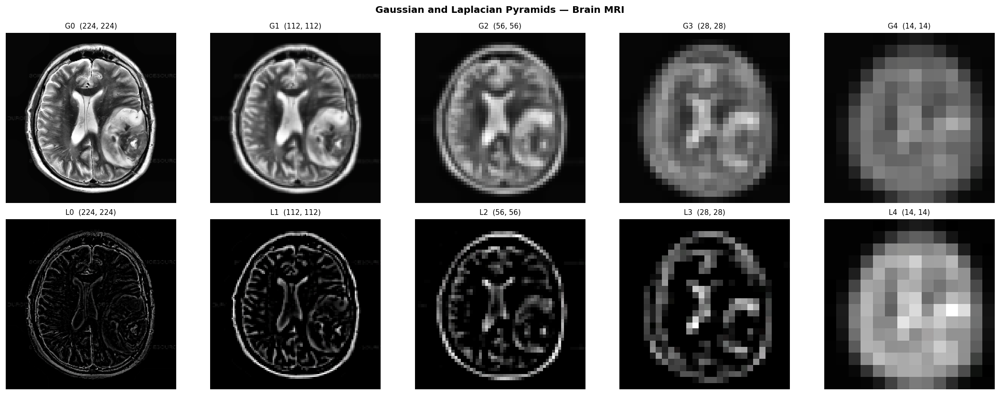

Scale-space blob detection (LoG):
Level    Shape           Blobs Detected
-----------------------------------
0        (224, 224)      443
1        (112, 112)      89
2        (56, 56)        26
3        (28, 28)        7
4        (14, 14)        1


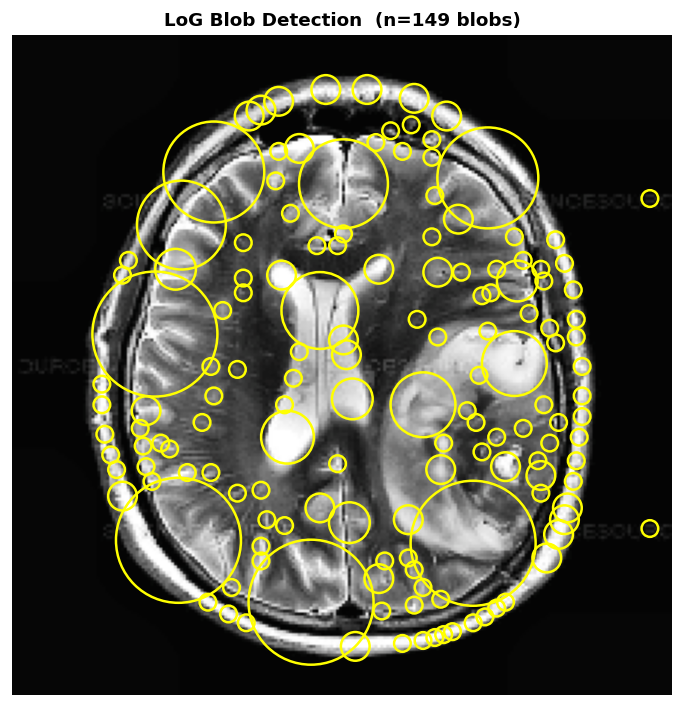

In [56]:
def build_gaussian_pyramid(img, levels=5):
    pyr = [img]
    cur = img.copy()
    for _ in range(levels - 1):
        cur = cv2.pyrDown(cur)
        pyr.append(cur)
    return pyr

def build_laplacian_pyramid(gauss):
    lap = []
    for i in range(len(gauss) - 1):
        up  = cv2.pyrUp(gauss[i + 1], dstsize=(gauss[i].shape[1], gauss[i].shape[0]))
        lap.append(cv2.subtract(gauss[i], up))
    lap.append(gauss[-1])
    return lap

LEVELS = 5
g_pyr = build_gaussian_pyramid(img1_enh, LEVELS)
l_pyr = build_laplacian_pyramid(g_pyr)

fig, axes = plt.subplots(2, LEVELS, figsize=(18, 7))
for i in range(LEVELS):
    axes[0, i].imshow(g_pyr[i])
    axes[0, i].set_title(f"G{i}  {g_pyr[i].shape[:2]}", fontsize=9)
    axes[0, i].axis("off")

    l_norm = cv2.normalize(l_pyr[i], None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    axes[1, i].imshow(l_norm, cmap="inferno")
    axes[1, i].set_title(f"L{i}  {l_pyr[i].shape[:2]}", fontsize=9)
    axes[1, i].axis("off")

axes[0, 0].set_ylabel("Gaussian", fontsize=10, fontweight="bold")
axes[1, 0].set_ylabel("Laplacian", fontsize=10, fontweight="bold")
plt.suptitle("Gaussian and Laplacian Pyramids — Brain MRI", fontweight="bold", fontsize=12)
plt.tight_layout()
plt.show()

# Scale-space blob detection using LoG
print("Scale-space blob detection (LoG):")
print(f"{'Level':<8} {'Shape':<15} {'Blobs Detected'}")
print("-" * 35)
for i, g in enumerate(g_pyr):
    gray  = cv2.cvtColor(g, cv2.COLOR_RGB2GRAY) / 255.0
    blobs = blob_log(gray, min_sigma=1, max_sigma=10, num_sigma=10, threshold=0.04)
    print(f"{i:<8} {str(g.shape[:2]):<15} {len(blobs)}")

# Visualise blobs at original scale
gray0   = cv2.cvtColor(g_pyr[0], cv2.COLOR_RGB2GRAY) / 255.0
blobs0  = blob_log(gray0, min_sigma=2, max_sigma=15, num_sigma=10, threshold=0.04)

fig, ax = plt.subplots(figsize=(6, 6))
ax.imshow(img1_enh)
for blob in blobs0:
    y, x, r = blob
    circle = plt.Circle((x, y), r * np.sqrt(2), color="yellow", linewidth=1.5, fill=False)
    ax.add_patch(circle)
ax.set_title(f"LoG Blob Detection  (n={len(blobs0)} blobs)", fontweight="bold")
ax.axis("off")
plt.tight_layout()
plt.show()

## 9. SIFT Feature Extraction and Matching

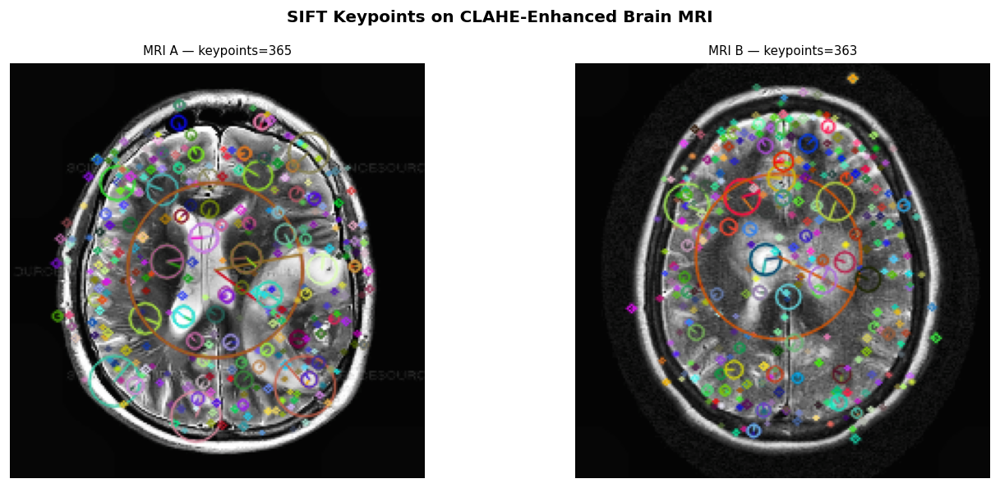

Keypoints A      : 365
Keypoints B      : 363
Raw matches      : 365
Good matches     : 6
Matching accuracy: 1.64%


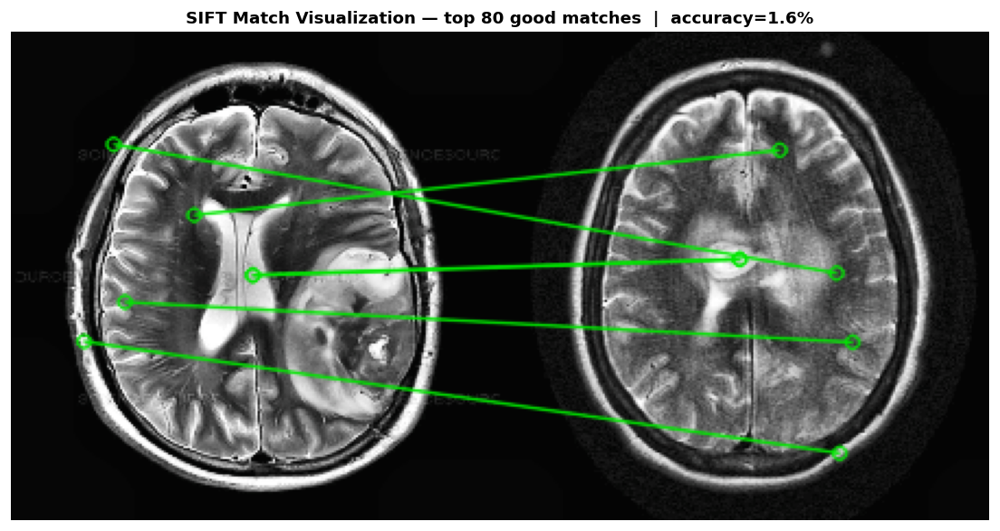

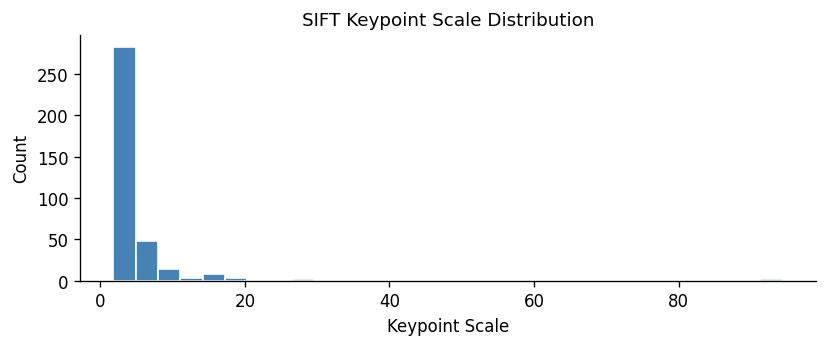

In [57]:
if not hasattr(cv2, "SIFT_create"):
    raise RuntimeError("SIFT unavailable. Install opencv-contrib-python.")

# Use two tumor images — same class gives more structural similarity
imgA = apply_clahe(load_image(tumor_paths[0]))
imgB = apply_clahe(load_image(tumor_paths[1]))
gA   = cv2.cvtColor(imgA, cv2.COLOR_RGB2GRAY)
gB   = cv2.cvtColor(imgB, cv2.COLOR_RGB2GRAY)

sift      = cv2.SIFT_create(nfeatures=1200, contrastThreshold=0.03, edgeThreshold=10)
kp1, des1 = sift.detectAndCompute(gA, None)
kp2, des2 = sift.detectAndCompute(gB, None)

imgA_kp = cv2.drawKeypoints(imgA, kp1, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
imgB_kp = cv2.drawKeypoints(imgB, kp2, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
show_images(
    [imgA_kp, imgB_kp],
    [f"MRI A — keypoints={len(kp1)}", f"MRI B — keypoints={len(kp2)}"],
    ncols=2, figsize=(12, 5),
    suptitle="SIFT Keypoints on CLAHE-Enhanced Brain MRI"
)

# FLANN-based matcher (faster and more accurate than brute-force for SIFT)
FLANN_INDEX_KDTREE = 1
index_params  = {"algorithm": FLANN_INDEX_KDTREE, "trees": 10}
search_params = {"checks": 100}
flann         = cv2.FlannBasedMatcher(index_params, search_params)

raw_matches, good_matches = [], []
if des1 is not None and des2 is not None and len(des1) > 1 and len(des2) > 1:
    raw_matches = flann.knnMatch(des1, des2, k=2)
    for pair in raw_matches:
        if len(pair) == 2:
            m, n = pair
            if m.distance < 0.70 * n.distance:   # Lowe's ratio test at 0.70
                good_matches.append(m)

matching_accuracy = len(good_matches) / max(len(raw_matches), 1)
print(f"Keypoints A      : {len(kp1)}")
print(f"Keypoints B      : {len(kp2)}")
print(f"Raw matches      : {len(raw_matches)}")
print(f"Good matches     : {len(good_matches)}")
print(f"Matching accuracy: {matching_accuracy * 100:.2f}%")

# Draw top-80 good matches
draw_params = dict(
    matchColor=(0, 230, 0),
    singlePointColor=(200, 200, 200),
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)
img_match = cv2.drawMatches(imgA, kp1, imgB, kp2, good_matches[:80], None, **draw_params)

plt.figure(figsize=(16, 5))
plt.imshow(img_match)
plt.title(f"SIFT Match Visualization — top 80 good matches  |  accuracy={matching_accuracy*100:.1f}%",
          fontweight="bold")
plt.axis("off")
plt.tight_layout()
plt.show()

# Keypoint size distribution
sizes = [kp.size for kp in kp1]
plt.figure(figsize=(7, 3))
plt.hist(sizes, bins=30, color="steelblue", edgecolor="white")
plt.title("SIFT Keypoint Scale Distribution")
plt.xlabel("Keypoint Scale")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

## 10. Image Segmentation — Otsu, K-Means, Watershed

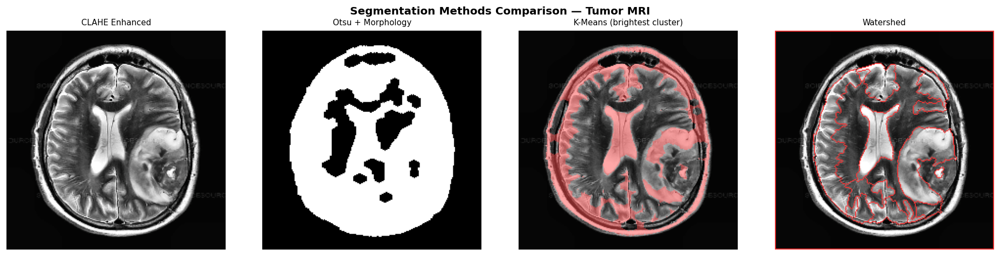

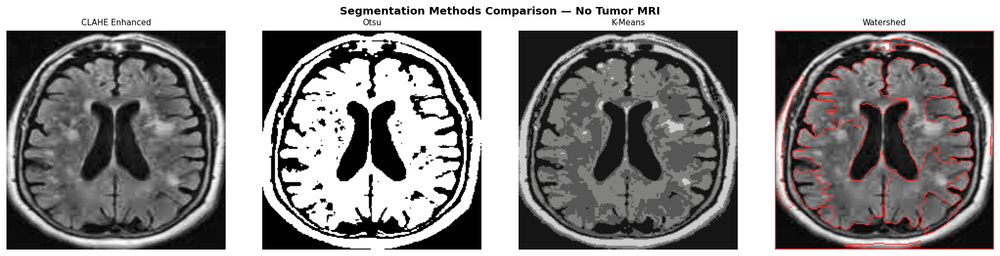

In [58]:
# Use CLAHE-enhanced image for better segmentation
seg_img  = img1_enh.copy()
seg_gray = cv2.cvtColor(seg_img, cv2.COLOR_RGB2GRAY)

# --- Otsu Thresholding ---
_, otsu_mask = cv2.threshold(seg_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
# Morphological cleanup
kernel     = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
otsu_clean = cv2.morphologyEx(otsu_mask, cv2.MORPH_CLOSE, kernel, iterations=2)
otsu_clean = cv2.morphologyEx(otsu_clean, cv2.MORPH_OPEN,  kernel, iterations=1)

# --- K-Means Segmentation ---
def kmeans_segment(img_rgb, k=4):
    px       = img_rgb.reshape(-1, 3).astype(np.float32)
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 200, 0.1)
    _, labels, centers = cv2.kmeans(px, k, None, criteria, 15, cv2.KMEANS_PP_CENTERS)
    centers  = np.uint8(centers)
    seg      = centers[labels.flatten()].reshape(img_rgb.shape)
    return seg, labels.reshape(img_rgb.shape[:2]), centers

km_img, km_labels, km_centers = kmeans_segment(seg_img, k=4)

# For brain MRI, tumor regions are typically hyperintense (bright) — select brightest cluster
center_lum     = np.array([0.299*c[0] + 0.587*c[1] + 0.114*c[2] for c in km_centers])
tumor_cluster  = int(np.argmax(center_lum))
km_mask_bin    = ((km_labels == tumor_cluster).astype(np.uint8) * 255)
km_mask_clean  = cv2.morphologyEx(km_mask_bin, cv2.MORPH_CLOSE, kernel, iterations=2)

# Overlay K-Means mask on original
km_overlay = seg_img.copy()
km_overlay[km_mask_clean > 0] = (km_overlay[km_mask_clean > 0] * 0.5 + np.array([255, 80, 80]) * 0.5).astype(np.uint8)

# --- Watershed Segmentation ---
def watershed_segment(img_rgb):
    gray    = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    blur    = cv2.GaussianBlur(gray, (5, 5), 0)
    _, th   = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel  = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(th, cv2.MORPH_OPEN, kernel, iterations=2)
    sure_bg = cv2.dilate(opening, kernel, iterations=4)
    dist    = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    _, sure_fg = cv2.threshold(dist, 0.4 * dist.max(), 255, 0)
    sure_fg    = np.uint8(sure_fg)
    unknown    = cv2.subtract(sure_bg, sure_fg)
    _, markers = cv2.connectedComponents(sure_fg)
    markers    = markers + 1
    markers[unknown == 255] = 0
    markers    = cv2.watershed(cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR), markers)
    result     = img_rgb.copy()
    result[markers == -1] = [255, 50, 50]
    ws_mask    = (markers > 1).astype(np.uint8) * 255
    return result, markers, ws_mask

ws_img, ws_markers, ws_mask_bin = watershed_segment(seg_img)

show_images(
    [seg_img, otsu_clean, km_overlay, ws_img],
    ["CLAHE Enhanced", "Otsu + Morphology", "K-Means (brightest cluster)", "Watershed"],
    ncols=4, figsize=(16, 4),
    suptitle="Segmentation Methods Comparison — Tumor MRI"
)

# Also show no-tumor segmentation
seg_img2  = img2_enh.copy()
_, otsu2  = cv2.threshold(cv2.cvtColor(seg_img2, cv2.COLOR_RGB2GRAY), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
km_img2, km_lab2, km_cen2 = kmeans_segment(seg_img2, k=4)
ws_img2, _, _ = watershed_segment(seg_img2)

show_images(
    [seg_img2, otsu2, km_img2, ws_img2],
    ["CLAHE Enhanced", "Otsu", "K-Means", "Watershed"],
    ncols=4, figsize=(16, 4),
    suptitle="Segmentation Methods Comparison — No Tumor MRI"
)

## 11. Segmentation Evaluation — IoU

         Method    IoU
Otsu (baseline) 1.0000
        K-Means 0.4761
      Watershed 0.5020


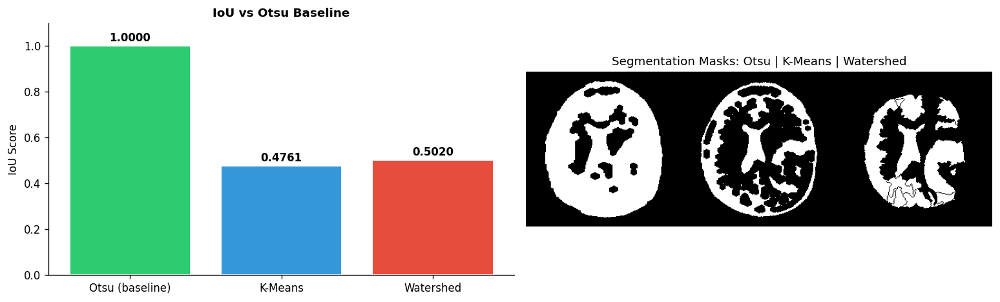

In [59]:
def compute_iou(mask_pred, mask_gt):
    pred  = mask_pred.astype(bool)
    gt    = mask_gt.astype(bool)
    inter = np.logical_and(pred, gt).sum()
    union = np.logical_or(pred, gt).sum()
    return inter / (union + 1e-8)

# Otsu clean is used as the pseudo ground-truth
otsu_gt  = otsu_clean > 0
km_bin   = km_mask_clean > 0
ws_bin   = ws_mask_bin > 0

iou_scores = pd.DataFrame({
    "Method": ["Otsu (baseline)", "K-Means", "Watershed"],
    "IoU":    [
        round(compute_iou(otsu_gt, otsu_gt), 4),
        round(compute_iou(km_bin,  otsu_gt), 4),
        round(compute_iou(ws_bin,  otsu_gt), 4),
    ],
})

print(iou_scores.to_string(index=False))

fig, axes = plt.subplots(1, 2, figsize=(13, 4))

bars = axes[0].bar(iou_scores["Method"], iou_scores["IoU"],
                   color=["#2ecc71", "#3498db", "#e74c3c"], edgecolor="white", linewidth=1.2)
axes[0].set_ylim(0, 1.1)
axes[0].set_title("IoU vs Otsu Baseline", fontweight="bold")
axes[0].set_ylabel("IoU Score")
for bar, val in zip(bars, iou_scores["IoU"]):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02,
                 f"{val:.4f}", ha="center", fontweight="bold")

# Side-by-side mask comparison
mask_display = np.hstack([
    (otsu_gt.astype(np.uint8) * 255),
    (km_bin.astype(np.uint8) * 255),
    (ws_bin.astype(np.uint8) * 255),
])
axes[1].imshow(mask_display, cmap="gray")
axes[1].set_title("Segmentation Masks: Otsu | K-Means | Watershed")
axes[1].axis("off")

plt.tight_layout()
plt.show()

## 12. Feature Engineering — Histogram + HOG + LBP + Statistical Moments

In [60]:
def extract_brain_mask(img_rgb):
    """Isolate the brain region by removing background."""
    gray      = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    _, thresh = cv2.threshold(gray, 15, 255, cv2.THRESH_BINARY)
    kernel    = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
    closed    = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=3)
    # Keep only the largest connected component
    n_labels, labels, stats, _ = cv2.connectedComponentsWithStats(closed)
    if n_labels > 1:
        largest = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])
        brain_mask = (labels == largest).astype(np.uint8) * 255
    else:
        brain_mask = closed
    return brain_mask > 0

def extract_features(img_rgb):
    img      = cv2.resize(img_rgb, (128, 128))
    img_enh  = apply_clahe(img)
    gray     = cv2.cvtColor(img_enh, cv2.COLOR_RGB2GRAY)
    brain_m  = extract_brain_mask(img)

    feats = []

    # 1. Color histograms (per channel, masked to brain region)
    for ch in range(3):
        vals = img_enh[:, :, ch][brain_m]
        if len(vals) == 0:
            vals = img_enh[:, :, ch].ravel()
        hist, _ = np.histogram(vals, bins=32, range=(0, 256), density=True)
        feats.extend(hist.tolist())

    # 2. Intensity statistics
    vals = gray[brain_m] if brain_m.any() else gray.ravel()
    feats.extend([
        float(vals.mean()),
        float(vals.std()),
        float(np.percentile(vals, 10)),
        float(np.percentile(vals, 25)),
        float(np.percentile(vals, 75)),
        float(np.percentile(vals, 90)),
        float(np.max(vals)),
        float(brain_m.sum()),
        float(brain_m.mean()),
    ])

    # 3. HOG features on masked gray image
    gray_m = gray.copy()
    gray_m[~brain_m] = 0
    hog_feat = hog(gray_m, orientations=9, pixels_per_cell=(8, 8),
                   cells_per_block=(2, 2), feature_vector=True)
    feats.extend(hog_feat.tolist())

    # 4. LBP texture features
    lbp      = local_binary_pattern(gray_m, P=24, R=3, method="uniform")
    lbp_hist, _ = np.histogram(lbp[brain_m] if brain_m.any() else lbp.ravel(),
                                bins=26, range=(0, 26), density=True)
    feats.extend(lbp_hist.tolist())

    # 5. Gradient (edge) statistics
    grad_x  = cv2.Sobel(gray_m, cv2.CV_64F, 1, 0, ksize=3)
    grad_y  = cv2.Sobel(gray_m, cv2.CV_64F, 0, 1, ksize=3)
    mag     = np.sqrt(grad_x**2 + grad_y**2)
    feats.extend([
        float(mag.mean()),
        float(mag.std()),
        float(mag.max()),
        float((mag > mag.mean()).sum()),
    ])

    return np.array(feats, dtype=np.float32)

print("Extracting features from all images...")
X_raw = np.array([extract_features(load_image(p)) for p in df["img_path"]])
y_raw = df["label_enc"].values

print(f"Feature matrix : {X_raw.shape}")
print(f"Labels shape   : {y_raw.shape}")
print(f"Class mapping  : {dict(enumerate(le.classes_))}")
print(f"NaN/Inf count  : {np.isnan(X_raw).sum()} / {np.isinf(X_raw).sum()}")

# Feature group breakdown
print("\nFeature breakdown:")
print(f"  Color histograms (3 channels x 32 bins) : 96")
print(f"  Intensity statistics                    : 9")
print(f"  HOG features                            : {len(hog(np.zeros((128,128)), orientations=9, pixels_per_cell=(8,8), cells_per_block=(2,2), feature_vector=True))}")
print(f"  LBP texture histogram                   : 26")
print(f"  Gradient statistics                     : 4")
print(f"  Total                                   : {X_raw.shape[1]}")

Extracting features from all images...
Feature matrix : (253, 8235)
Labels shape   : (253,)
Class mapping  : {0: 'No Tumor', 1: 'Tumor'}
NaN/Inf count  : 0 / 0

Feature breakdown:
  Color histograms (3 channels x 32 bins) : 96
  Intensity statistics                    : 9
  HOG features                            : 8100
  LBP texture histogram                   : 26
  Gradient statistics                     : 4
  Total                                   : 8235


## 13. Feature Scaling, PCA, and Train/Test Split

Train / Test : (189, 80)  /  (64, 80)
Train class distribution : {np.int64(0): np.int64(73), np.int64(1): np.int64(116)}
Test  class distribution : {np.int64(0): np.int64(25), np.int64(1): np.int64(39)}
Components for 95% var   : 1 of 80
Explained variance (80 comps): 79.32%


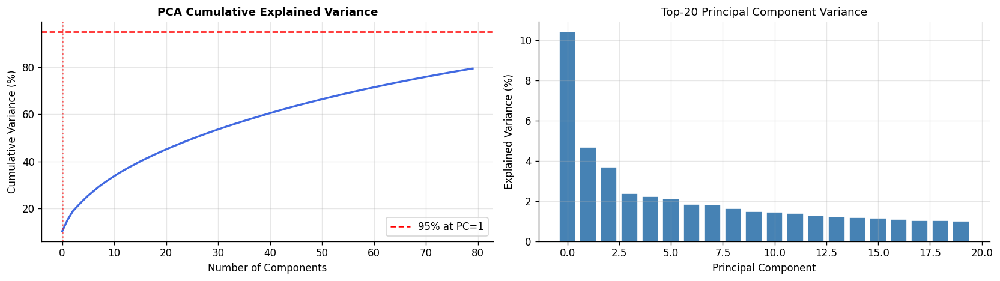

In [61]:
X_tr_raw, X_te_raw, y_tr, y_te = train_test_split(
    X_raw, y_raw, test_size=0.25, random_state=42, stratify=y_raw
)

# Replace any NaN/Inf before scaling
X_tr_raw = np.nan_to_num(X_tr_raw)
X_te_raw = np.nan_to_num(X_te_raw)

scaler = StandardScaler()
X_tr_s = scaler.fit_transform(X_tr_raw)
X_te_s = scaler.transform(X_te_raw)

n_comp = min(80, X_tr_s.shape[0] - 1, X_tr_s.shape[1])
pca = PCA(n_components=n_comp, random_state=42)
X_tr = pca.fit_transform(X_tr_s)
X_te = pca.transform(X_te_s)

cumvar = np.cumsum(pca.explained_variance_ratio_) * 100
n95    = np.argmax(cumvar >= 95) + 1

print(f"Train / Test : {X_tr.shape}  /  {X_te.shape}")
print(f"Train class distribution : {dict(zip(*np.unique(y_tr, return_counts=True)))}")
print(f"Test  class distribution : {dict(zip(*np.unique(y_te, return_counts=True)))}")
print(f"Components for 95% var   : {n95} of {n_comp}")
print(f"Explained variance ({n_comp} comps): {cumvar[-1]:.2f}%")

fig, axes = plt.subplots(1, 2, figsize=(14, 4))

axes[0].plot(cumvar, color="royalblue", linewidth=2)
axes[0].axhline(95, color="red", linestyle="--", label=f"95% at PC={n95}")
axes[0].axvline(n95 - 1, color="red", linestyle=":", alpha=0.6)
axes[0].set_title("PCA Cumulative Explained Variance", fontweight="bold")
axes[0].set_xlabel("Number of Components")
axes[0].set_ylabel("Cumulative Variance (%)")
axes[0].legend()
axes[0].grid(alpha=0.3)

axes[1].bar(range(min(20, n_comp)),
            pca.explained_variance_ratio_[:20] * 100,
            color="steelblue", edgecolor="white")
axes[1].set_title("Top-20 Principal Component Variance")
axes[1].set_xlabel("Principal Component")
axes[1].set_ylabel("Explained Variance (%)")
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

## 14. Classification — Naive Bayes, AdaBoost, Gradient Boosting, Random Forest

            Model  Accuracy  F1 Macro  CV F1 Mean  CV F1 Std
      Naive Bayes     46.88     42.31       72.80       2.85
         AdaBoost     82.81     82.07       80.10       3.25
Gradient Boosting     82.81     81.15       81.23       6.43
    Random Forest     76.56     73.73       76.00       2.06

Best model: AdaBoost  (F1=82.07%)


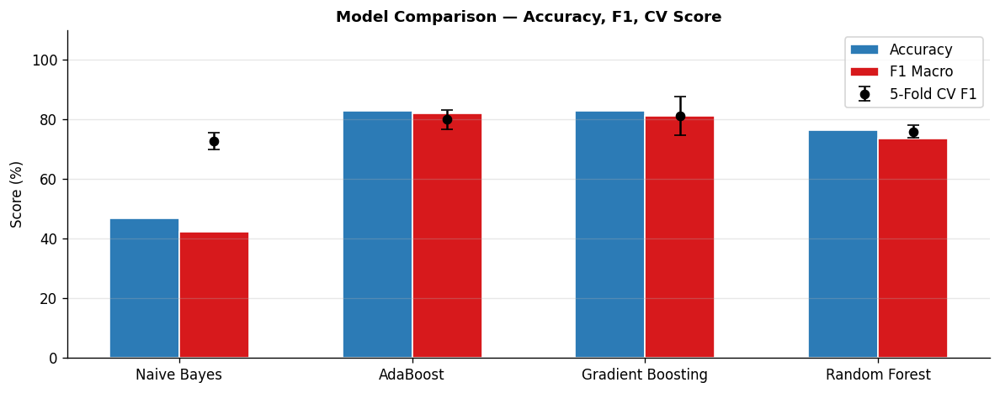

In [62]:
classifiers = {
    "Naive Bayes":        GaussianNB(),
    "AdaBoost":           AdaBoostClassifier(n_estimators=200, learning_rate=0.5, random_state=42),
    "Gradient Boosting":  GradientBoostingClassifier(n_estimators=200, learning_rate=0.08,
                                                      max_depth=3, subsample=0.8, random_state=42),
    "Random Forest":      RandomForestClassifier(n_estimators=300, max_depth=None,
                                                  min_samples_split=4, random_state=42, n_jobs=-1),
}

results = {}
for name, clf in classifiers.items():
    clf.fit(X_tr, y_tr)
    y_pred   = clf.predict(X_te)
    cv_score = cross_val_score(clf, X_tr, y_tr, cv=5, scoring="f1_macro")
    results[name] = {
        "clf":      clf,
        "y_pred":   y_pred,
        "accuracy": accuracy_score(y_te, y_pred),
        "f1":       f1_score(y_te, y_pred, average="macro", zero_division=0),
        "cv_mean":  cv_score.mean(),
        "cv_std":   cv_score.std(),
    }

model_table = pd.DataFrame([
    {"Model": name,
     "Accuracy": round(v["accuracy"] * 100, 2),
     "F1 Macro": round(v["f1"] * 100, 2),
     "CV F1 Mean": round(v["cv_mean"] * 100, 2),
     "CV F1 Std":  round(v["cv_std"]  * 100, 2)}
    for name, v in results.items()
])

print(model_table.to_string(index=False))

best_name  = model_table.sort_values("F1 Macro", ascending=False).iloc[0]["Model"]
best_pred  = results[best_name]["y_pred"]
best_model = results[best_name]["clf"]
print(f"\nBest model: {best_name}  (F1={results[best_name]['f1']*100:.2f}%)")

fig, ax = plt.subplots(figsize=(10, 4))
x   = np.arange(len(model_table))
w   = 0.3
ax.bar(x - w/2, model_table["Accuracy"], w, label="Accuracy", color="#2C7BB6", edgecolor="white")
ax.bar(x + w/2, model_table["F1 Macro"],  w, label="F1 Macro",  color="#D7191C", edgecolor="white")
ax.errorbar(x + w/2, model_table["CV F1 Mean"],
            yerr=model_table["CV F1 Std"], fmt="o", color="black",
            label="5-Fold CV F1", capsize=4)
ax.set_xticks(x)
ax.set_xticklabels(model_table["Model"])
ax.set_ylim(0, 110)
ax.set_ylabel("Score (%)")
ax.set_title("Model Comparison — Accuracy, F1, CV Score", fontweight="bold")
ax.legend()
ax.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()

## 15. Model Evaluation — Confusion Matrix, Classification Report, ROC Curve

Best Model: AdaBoost
-----------------------------------
  accuracy              : 0.8281  (82.81%)
  precision_macro       : 0.8188  (81.88%)
  recall_macro          : 0.8231  (82.31%)
  f1_macro              : 0.8207  (82.07%)

Classification Report:
              precision    recall  f1-score   support

    No Tumor       0.77      0.80      0.78        25
       Tumor       0.87      0.85      0.86        39

    accuracy                           0.83        64
   macro avg       0.82      0.82      0.82        64
weighted avg       0.83      0.83      0.83        64



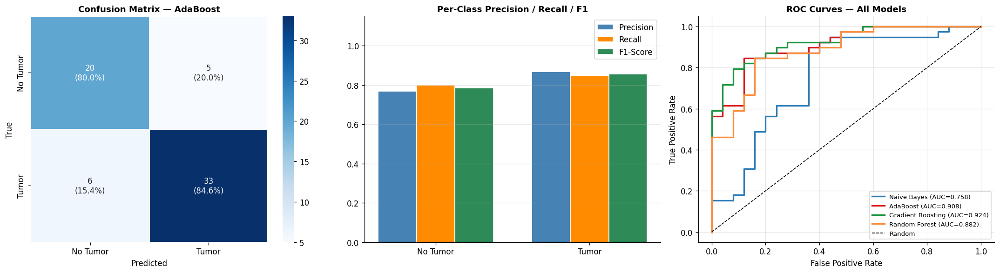


AUC Scores:
  Naive Bayes           : AUC = 0.7579
  AdaBoost              : AUC = 0.9077
  Gradient Boosting     : AUC = 0.9241
  Random Forest         : AUC = 0.8821


In [63]:
eval_metrics = {
    "accuracy":         accuracy_score(y_te, best_pred),
    "precision_macro":  precision_score(y_te, best_pred, average="macro", zero_division=0),
    "recall_macro":     recall_score(y_te, best_pred, average="macro", zero_division=0),
    "f1_macro":         f1_score(y_te, best_pred, average="macro", zero_division=0),
}

print(f"Best Model: {best_name}")
print("-" * 35)
for k, v in eval_metrics.items():
    print(f"  {k:<22}: {v:.4f}  ({v*100:.2f}%)")

print("\nClassification Report:")
print(classification_report(y_te, best_pred, target_names=le.classes_, zero_division=0))

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Confusion matrix
cm = confusion_matrix(y_te, best_pred)
cm_pct = cm.astype(float) / cm.sum(axis=1, keepdims=True) * 100
annot  = np.array([[f"{c}\n({p:.1f}%)" for c, p in zip(r_c, r_p)]
                   for r_c, r_p in zip(cm, cm_pct)])
sns.heatmap(cm, annot=annot, fmt="", cmap="Blues",
            xticklabels=le.classes_, yticklabels=le.classes_,
            linewidths=1, ax=axes[0])
axes[0].set_title(f"Confusion Matrix — {best_name}", fontweight="bold")
axes[0].set_xlabel("Predicted")
axes[0].set_ylabel("True")

# Per-class P/R/F1
per_p = precision_score(y_te, best_pred, average=None, zero_division=0)
per_r = recall_score(y_te, best_pred, average=None, zero_division=0)
per_f = f1_score(y_te, best_pred, average=None, zero_division=0)
x_pos = np.arange(len(le.classes_))
w     = 0.25
axes[1].bar(x_pos - w, per_p, w, label="Precision", color="steelblue",   edgecolor="white")
axes[1].bar(x_pos,     per_r, w, label="Recall",    color="darkorange",  edgecolor="white")
axes[1].bar(x_pos + w, per_f, w, label="F1-Score",  color="seagreen",    edgecolor="white")
axes[1].set_xticks(x_pos)
axes[1].set_xticklabels(le.classes_)
axes[1].set_ylim(0, 1.15)
axes[1].set_title("Per-Class Precision / Recall / F1", fontweight="bold")
axes[1].legend()
axes[1].grid(axis="y", alpha=0.3)

# ROC Curve (all models)
tumor_class_idx = list(le.classes_).index("Tumor")
roc_colors = ["#2C7BB6", "#D7191C", "#1a9641", "#fd8d3c"]
for (name, res), color in zip(results.items(), roc_colors):
    clf = res["clf"]
    if hasattr(clf, "predict_proba"):
        proba = clf.predict_proba(X_te)[:, tumor_class_idx]
        fpr, tpr, _ = roc_curve(y_te, proba, pos_label=tumor_class_idx)
        auc_val     = roc_auc_score(y_te, proba)
        axes[2].plot(fpr, tpr, color=color, linewidth=2,
                     label=f"{name} (AUC={auc_val:.3f})")

axes[2].plot([0, 1], [0, 1], "k--", linewidth=1, label="Random")
axes[2].set_title("ROC Curves — All Models", fontweight="bold")
axes[2].set_xlabel("False Positive Rate")
axes[2].set_ylabel("True Positive Rate")
axes[2].legend(loc="lower right", fontsize=8)
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

# AUC scores table
print("\nAUC Scores:")
for name, res in results.items():
    clf = res["clf"]
    if hasattr(clf, "predict_proba"):
        proba   = clf.predict_proba(X_te)[:, tumor_class_idx]
        auc_val = roc_auc_score(y_te, proba)
        print(f"  {name:<22}: AUC = {auc_val:.4f}")

## 16. Feature Importance Analysis

Feature Group Importance (Gradient Boosting):
  HOG                 : 98.83%
  Color Hist          : 0.79%
  Intensity Stats     : 0.17%
  LBP Texture         : 0.16%
  Gradient            : 0.06%


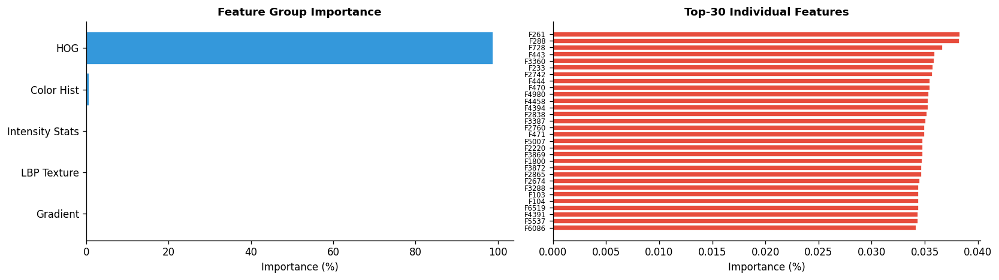

In [64]:
# Use Gradient Boosting feature importances projected back through PCA
gb_clf = results["Gradient Boosting"]["clf"]
fi_pca = gb_clf.feature_importances_

# Project importance from PCA space back to original feature space
fi_original = np.abs(pca.components_.T @ fi_pca)
fi_original /= fi_original.sum()

# Group by feature type
n_hog = len(hog(np.zeros((128, 128)), orientations=9, pixels_per_cell=(8, 8),
                cells_per_block=(2, 2), feature_vector=True))
groups = {
    "Color Hist":  (0, 96),
    "Intensity Stats": (96, 105),
    "HOG":         (105, 105 + n_hog),
    "LBP Texture": (105 + n_hog, 105 + n_hog + 26),
    "Gradient":    (105 + n_hog + 26, len(fi_original)),
}

group_importance = {name: fi_original[s:e].sum() for name, (s, e) in groups.items()}

print("Feature Group Importance (Gradient Boosting):")
for name, imp in sorted(group_importance.items(), key=lambda x: -x[1]):
    print(f"  {name:<20}: {imp*100:.2f}%")

fig, axes = plt.subplots(1, 2, figsize=(14, 4))

sorted_groups = sorted(group_importance.items(), key=lambda x: x[1])
names_g, vals_g = zip(*sorted_groups)
axes[0].barh(names_g, [v * 100 for v in vals_g], color="#3498db", edgecolor="white")
axes[0].set_title("Feature Group Importance", fontweight="bold")
axes[0].set_xlabel("Importance (%)")

top_k = 30
top_idx = np.argsort(fi_original)[-top_k:]
axes[1].barh(range(top_k), fi_original[top_idx] * 100, color="#e74c3c", edgecolor="white")
axes[1].set_yticks(range(top_k))
axes[1].set_yticklabels([f"F{i}" for i in top_idx], fontsize=7)
axes[1].set_title(f"Top-{top_k} Individual Features", fontweight="bold")
axes[1].set_xlabel("Importance (%)")

plt.tight_layout()
plt.show()

## 17. Integrated End-to-End Inference Pipeline

Sample   File                           True         Pred         Result
------------------------------------------------------------------------
1        Y91.jpg                        Tumor        No Tumor     WRONG


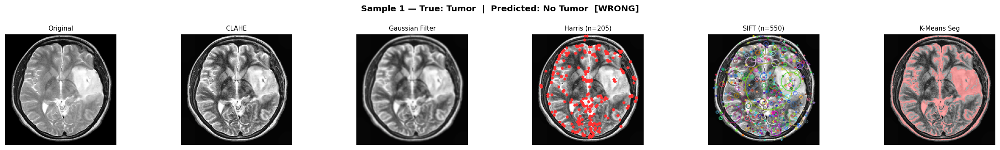

2        Y103.jpg                       Tumor        Tumor        CORRECT


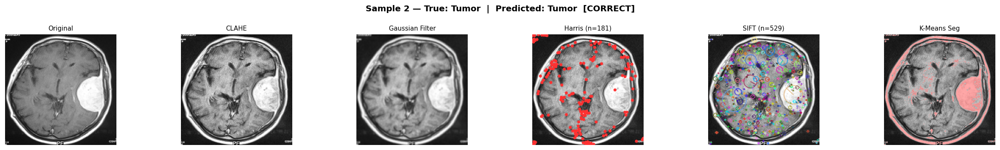

3        Y34.jpg                        Tumor        Tumor        CORRECT


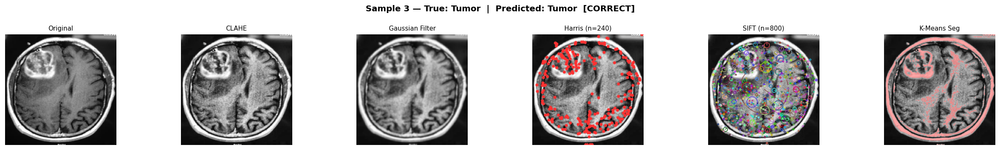

4        No15.jpg                       No Tumor     No Tumor     CORRECT


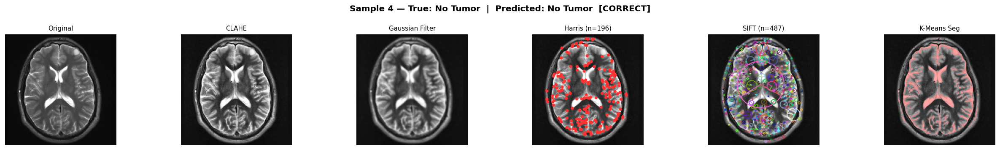

5        no 9.png                       No Tumor     No Tumor     CORRECT


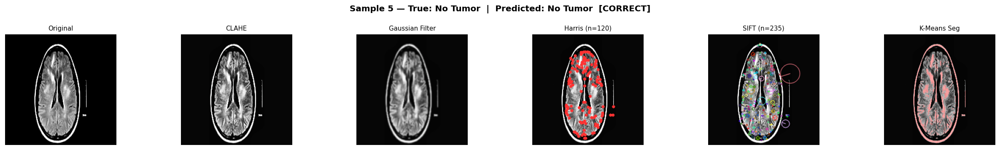

6        no 89.jpg                      No Tumor     No Tumor     CORRECT


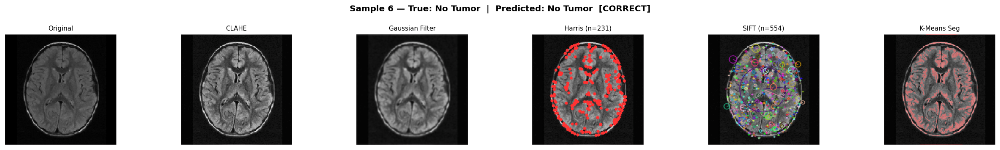

In [65]:
def full_pipeline(img_path, classifier=best_model):
    result = {}
    img    = load_image(img_path)
    img_e  = apply_clahe(img)
    gray   = cv2.cvtColor(img_e, cv2.COLOR_RGB2GRAY)

    result["original"]    = img
    result["clahe"]       = img_e
    result["gaussian"]    = cv2.GaussianBlur(img_e, (5, 5), sigmaX=1.0)
    result["median"]      = cv2.medianBlur(img_e, 5)

    _, c_mask = harris_corners(gray, threshold=0.015)
    h_img, n_c = draw_corners(img_e, c_mask)
    result["harris"]       = h_img
    result["corner_count"] = n_c

    result["gauss_pyramid"] = build_gaussian_pyramid(img_e, levels=4)

    sift_local = cv2.SIFT_create(nfeatures=800, contrastThreshold=0.03)
    kps, _     = sift_local.detectAndCompute(gray, None)
    result["sift_img"]   = cv2.drawKeypoints(
        img_e, kps, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
    )
    result["sift_count"] = len(kps)

    seg, km_lab, km_cen = kmeans_segment(img_e, k=4)
    lum            = np.array([0.299*c[0] + 0.587*c[1] + 0.114*c[2] for c in km_cen])
    tc             = int(np.argmax(lum))
    km_ov          = img_e.copy()
    mask_ov        = (km_lab == tc)
    km_ov[mask_ov] = (km_ov[mask_ov] * 0.5 + np.array([255, 80, 80]) * 0.5).astype(np.uint8)
    result["segmented"] = km_ov

    feat     = extract_features(img).reshape(1, -1)
    feat     = np.nan_to_num(feat)
    feat_pca = pca.transform(scaler.transform(feat))
    pred_idx = classifier.predict(feat_pca)[0]

    result["prediction"]    = le.inverse_transform([pred_idx])[0]
    result["probabilities"] = classifier.predict_proba(feat_pca)[0] \
                              if hasattr(classifier, "predict_proba") else None
    return result


# Run on 6 test samples (3 tumor, 3 no-tumor)
_, X_te_paths, _, y_te_labels = train_test_split(
    df["img_path"].values, df["label_clean"].values,
    test_size=0.25, random_state=42, stratify=df["label_enc"].values
)
te_df = pd.DataFrame({"img_path": X_te_paths, "label_clean": y_te_labels})
sample_te = pd.concat([
    te_df[te_df["label_clean"] == "Tumor"].head(3),
    te_df[te_df["label_clean"] == "No Tumor"].head(3)
]).reset_index(drop=True)

print(f"{'Sample':<8} {'File':<30} {'True':<12} {'Pred':<12} {'Result'}")
print("-" * 72)

for i, row in sample_te.iterrows():
    res        = full_pipeline(row["img_path"])
    true_label = row["label_clean"]
    pred_label = res["prediction"]
    correct    = "CORRECT" if pred_label == true_label else "WRONG"
    print(f"{i+1:<8} {os.path.basename(row['img_path']):<30} {true_label:<12} {pred_label:<12} {correct}")

    show_images(
        [res["original"], res["clahe"], res["gaussian"],
         res["harris"], res["sift_img"], res["segmented"]],
        ["Original", "CLAHE", "Gaussian Filter",
         f"Harris (n={res['corner_count']})", f"SIFT (n={res['sift_count']})", "K-Means Seg"],
        ncols=6, figsize=(21, 3),
        suptitle=f"Sample {i+1} — True: {true_label}  |  Predicted: {pred_label}  [{correct}]"
    )

## 18. Class Probability Visualization

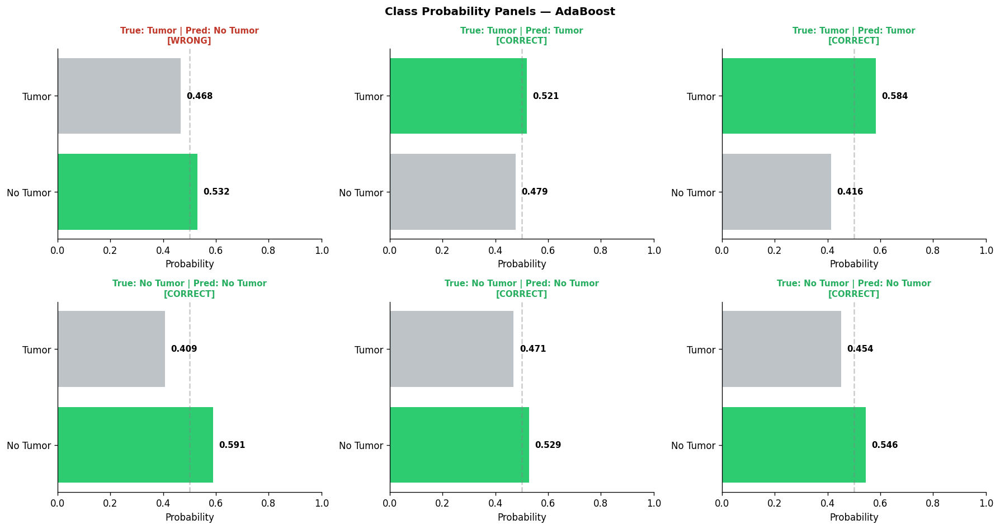

In [66]:
# Run inference on all 6 samples and display probability panels
inferences = [(row["img_path"], row["label_clean"], full_pipeline(row["img_path"]))
              for _, row in sample_te.iterrows()]

fig, axes = plt.subplots(2, 3, figsize=(15, 8))
axes = axes.ravel()

for idx, (path, true_label, res) in enumerate(inferences):
    ax = axes[idx]
    if res["probabilities"] is not None:
        probs   = res["probabilities"]
        pred    = res["prediction"]
        colors  = ["#2ecc71" if c == pred else "#bdc3c7" for c in le.classes_]
        bars    = ax.barh(le.classes_, probs, color=colors, edgecolor="white", linewidth=1.2)
        ax.set_xlim(0, 1)
        ax.axvline(0.5, color="gray", linestyle="--", alpha=0.4)
        for bar, val in zip(bars, probs):
            ax.text(min(val + 0.02, 0.92), bar.get_y() + bar.get_height()/2,
                    f"{val:.3f}", va="center", fontsize=9, fontweight="bold")
        correct = "CORRECT" if pred == true_label else "WRONG"
        color   = "#27ae60" if pred == true_label else "#c0392b"
        ax.set_title(f"True: {true_label} | Pred: {pred}\n[{correct}]",
                     color=color, fontweight="bold", fontsize=9)
        ax.set_xlabel("Probability")

plt.suptitle(f"Class Probability Panels — {best_name}", fontweight="bold", fontsize=12)
plt.tight_layout()
plt.show()

## 19. Results Summary

In [67]:
# Compute AUC for best model
best_proba = best_model.predict_proba(X_te)[:, tumor_class_idx] \
             if hasattr(best_model, "predict_proba") else None
best_auc   = float(roc_auc_score(y_te, best_proba)) if best_proba is not None else None

summary = {
    "dataset": {
        "total_images":  int(len(df)),
        "classes":       list(map(str, le.classes_)),
        "class_counts":  df["label_clean"].value_counts().to_dict(),
        "train_size":    int(len(y_tr)),
        "test_size":     int(len(y_te)),
    },
    "preprocessing": {
        "filtering_results": filter_metrics.to_dict(orient="records"),
    },
    "harris": {
        "corners_detected": int(n_c),
        "threshold_used":   0.015,
    },
    "pyramids": {
        "levels":   LEVELS,
        "types":    ["Gaussian", "Laplacian"],
    },
    "sift_matching": {
        "raw_matches":       int(len(raw_matches)),
        "good_matches":      int(len(good_matches)),
        "matching_accuracy": round(float(matching_accuracy), 4),
        "matcher":           "FLANN KD-Tree",
    },
    "segmentation_iou":  iou_scores.to_dict(orient="records"),
    "classification": {
        "models": [
            {"name":     name,
             "accuracy": round(float(v["accuracy"]), 4),
             "f1_macro": round(float(v["f1"]),       4),
             "cv_f1":    round(float(v["cv_mean"]),  4)}
            for name, v in results.items()
        ],
        "best_model": str(best_name),
        "best_metrics": {
            **{k: round(float(v), 4) for k, v in eval_metrics.items()},
            "roc_auc": round(best_auc, 4) if best_auc is not None else None,
        },
    },
}

print(json.dumps(summary, indent=2))

{
  "dataset": {
    "total_images": 253,
    "classes": [
      "No Tumor",
      "Tumor"
    ],
    "class_counts": {
      "Tumor": 155,
      "No Tumor": 98
    },
    "train_size": 189,
    "test_size": 64
  },
  "preprocessing": {
    "filtering_results": [
      {
        "Method": "Noisy",
        "MSE": 159.3309,
        "PSNR": 26.1078
      },
      {
        "Method": "Gaussian 5x5",
        "MSE": 285.9022,
        "PSNR": 23.5686
      },
      {
        "Method": "Gaussian 11x11",
        "MSE": 620.7595,
        "PSNR": 20.2016
      },
      {
        "Method": "Median k=3",
        "MSE": 199.8843,
        "PSNR": 25.123
      },
      {
        "Method": "Median k=7",
        "MSE": 585.9721,
        "PSNR": 20.452
      },
      {
        "Method": "Bilateral",
        "MSE": 62.962,
        "PSNR": 30.14
      },
      {
        "Method": "CLAHE",
        "MSE": 794.4271,
        "PSNR": 19.1303
      }
    ]
  },
  "harris": {
    "corners_detected": 222,
    "thr